<a href="https://colab.research.google.com/github/sabrinaMKE201073/OpenCV-python/blob/main/computer_vision_with_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><b>Computer Vision with OpenCV Python

In [25]:
import os #interact with file system paths
from PIL import Image
from PIL import ImageOps
import cv2 #performing image processing and computer vision tasks.
import numpy as np
import matplotlib.pyplot as plt #display plot
%matplotlib inline

# You can also use this section to suppress warnings generated by your code:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn
warnings.filterwarnings('ignore')

In [26]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IND-GPXX0XSBEN/lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IND-GPXX0XSBEN/baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IND-GPXX0XSBEN/driver.jpg

--2023-06-30 03:40:44--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IND-GPXX0XSBEN/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 471314 (460K) [image/png]
Saving to: ‘lenna.png.1’

lenna.png.1         100%[===================>] 460.27K  1.99MB/s    in 0.2s    

2023-06-30 03:40:45 (1.99 MB/s) - ‘lenna.png.1’ saved [471314/471314]

--2023-06-30 03:40:45--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IND-GPXX0XSBEN/baboon.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-

In [27]:
#to concatenate two images side-by-side
def get_concat_h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

In [28]:
my_image = "lenna.png"

In [29]:
#image files & paths
cwd = os.getcwd()
cwd
#cwd = current working directory

'/content'

In [30]:
image_path = os.path.join(cwd, my_image)
image_path

'/content/lenna.png'

<h1><b>Load image using OpenCV</b></h1>

- OpenCV is a library used for computer vision. It has more functionality than the PIL library but is more difficult to use. We can import OpenCV as follows:

In [31]:
#read image
image = cv2.imread(my_image)

In [32]:
type(image)

numpy.ndarray

In [33]:
#get shape of the array from the shape attribute
h, w, c = image.shape
print('height: ', h)
print('width:  ', w)
print('channel:', c)

height:  512
width:   512
channel: 3


In [34]:
image.max()

255

In [35]:
image.min()

3

<h2><b>Plot an Image

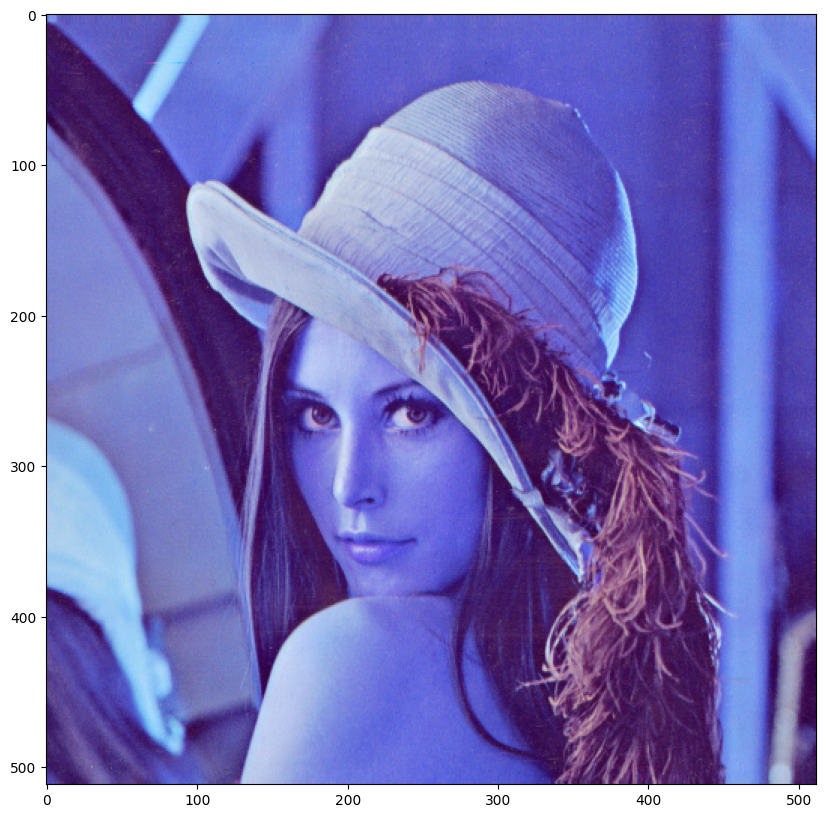

In [36]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

The image output doesn't look natural.
- This is because the order of RGB Channels are different.
- We can change the color space with conversion code and the function cvtColor from the cv2 library:

In [37]:
new_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

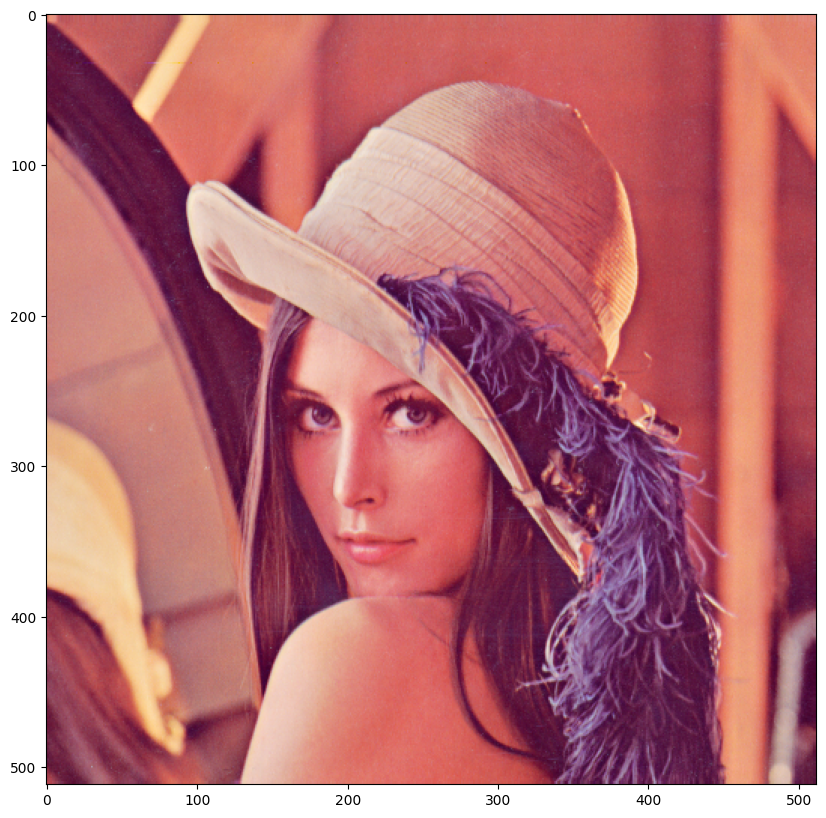

In [38]:
#show image
plt.figure(figsize=(10,10))
plt.imshow(new_image)
plt.show()

In [39]:
#load image using its path
image = cv2.imread(image_path)
image.shape

(512, 512, 3)

In [40]:
#to save image as jpg format
cv2.imwrite("lenna.jpg", image)

True

<h2><b>Gray Scale Images, Quantization and Color Channels

In [41]:
#change color image to gray
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#show the image shape
image_gray.shape

(512, 512)

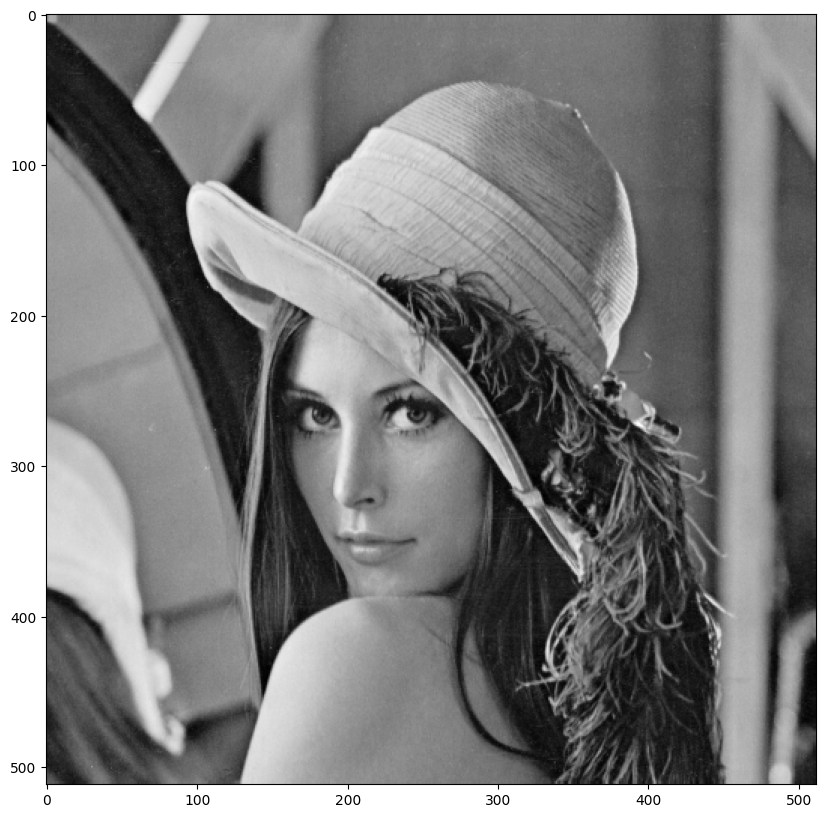

In [42]:
#plot the image
plt.figure(figsize=(10, 10))
plt.imshow(image_gray, cmap='gray')
plt.show()

In [43]:
#save this new gray image as jpg
cv2.imwrite('lena_gray_cv.jpg', image_gray)

True

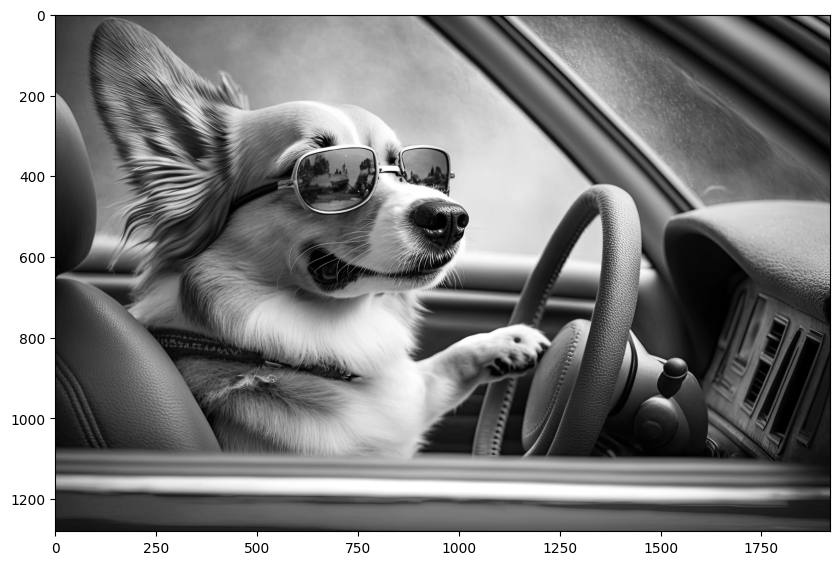

In [44]:
#change other image to grayscale
im = cv2.imread('driver.jpg')
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

#plot the image
plt.figure(figsize=(10,10))
plt.imshow(im_gray,cmap='gray')
plt.show()

<h2><b>Color Channel


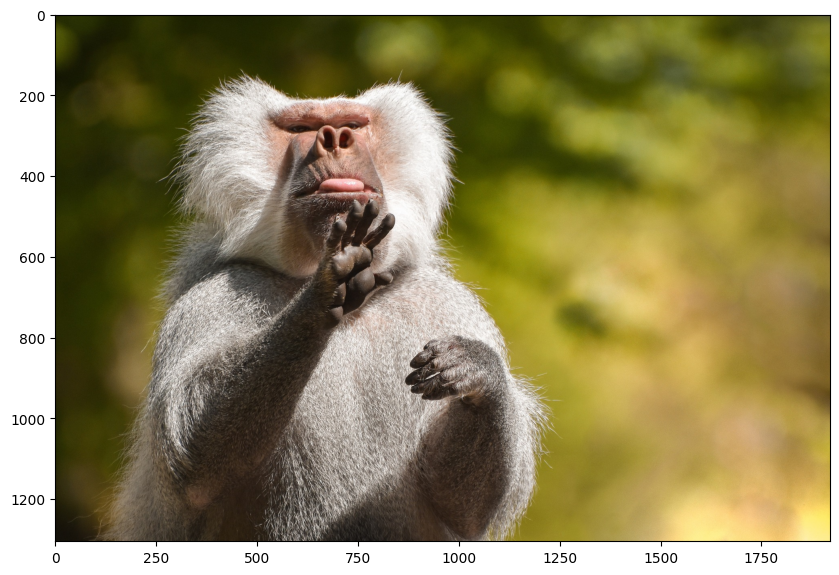

In [45]:
baboon=cv2.imread('baboon.png')
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.show()

In [46]:
#Obtain the different RGB colors and
#assign them to the variables blue, green, and red, in (B, G, R) format.
blue, green, red = baboon[:, :, 0], baboon[:, :, 1], baboon[:, :, 2]


In [47]:
#concantenate each image using function vconcat
im_bgr = cv2.vconcat([blue, green, red])

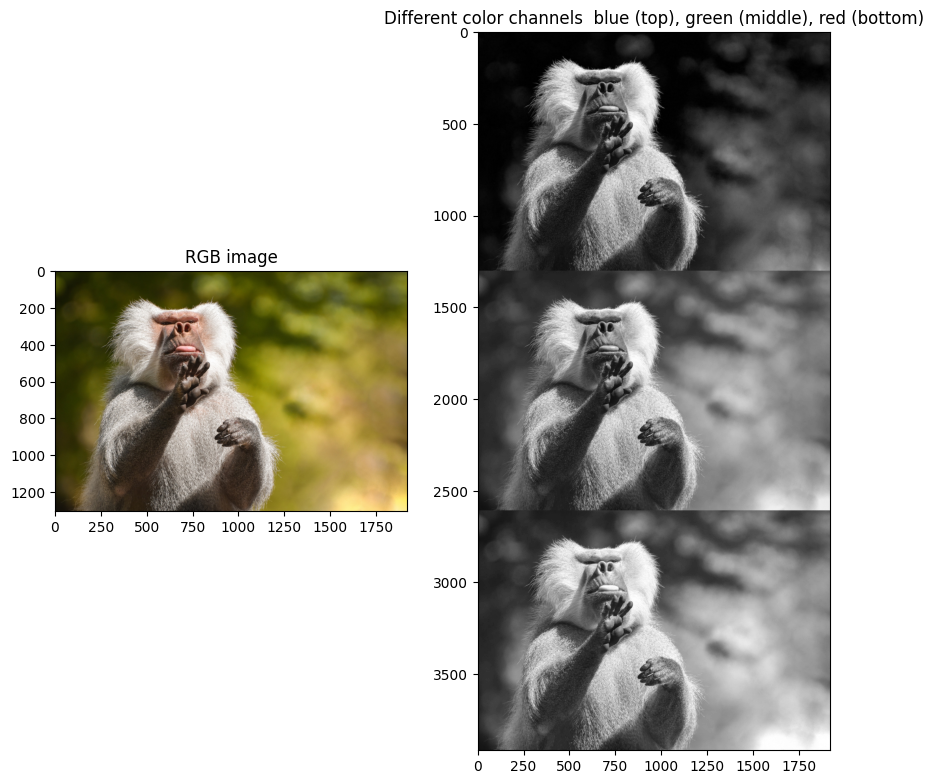

In [48]:
#plot the color image to red channel in grayscale
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.title("RGB image")
plt.subplot(122)
plt.imshow(im_bgr,cmap='gray')
plt.title("Different color channels  blue (top), green (middle), red (bottom)")
plt.show()

#we can see regions with red have higher intensity value

Why do the images with different color channels appear grey?

- This is because they're now single-channel images, which will be saved in grayscale.
- To see actual colors instead of grey images, we should keep all three channels and set the other two to zero.

<h2><b>Indexing

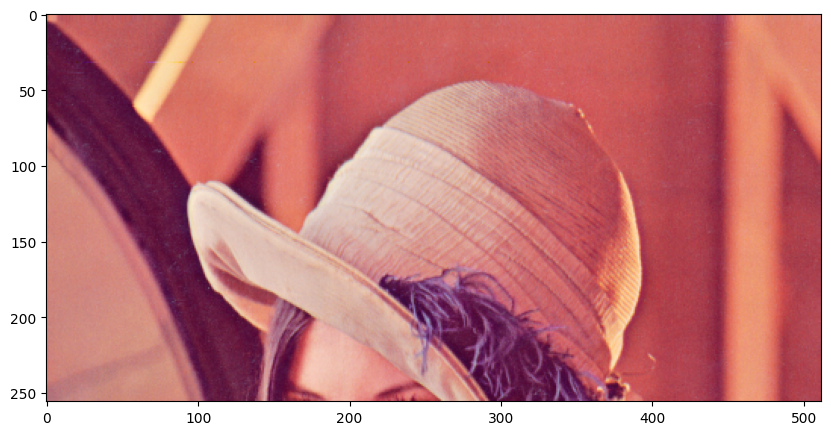

In [49]:
#use indexing of numpy arrays to crop images
#set the value you wish to crop
rows = 256
plt.figure(figsize=(10,10))
plt.imshow(new_image[0:rows,:,:])
plt.show()

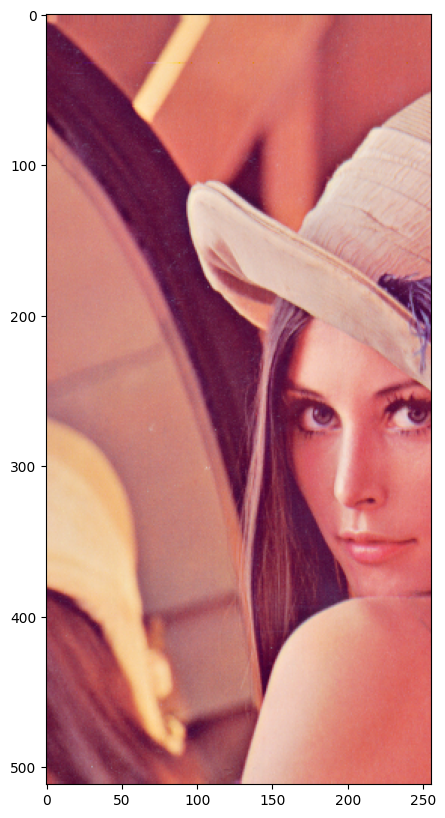

In [50]:
#return the first 256 columns corresponding to the first half of the image
columns = 256
plt.figure(figsize=(10,10))
plt.imshow(new_image[:,0:columns,:])
plt.show()

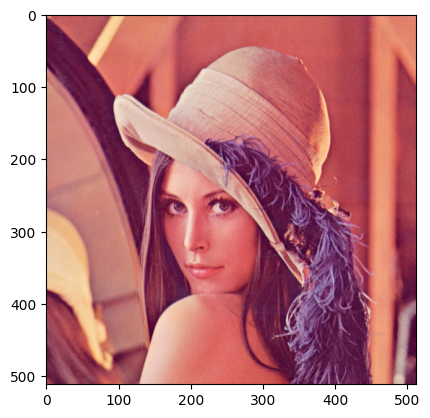

In [51]:

A = new_image.copy()
plt.imshow(A)
plt.show()

If we do not apply the method copy(), the variable will point to the same location in memory.
- Consider the variable B below, if we set all values of array A to zero, since A and B points to the same object in the memory, B will also have all-zero elements:

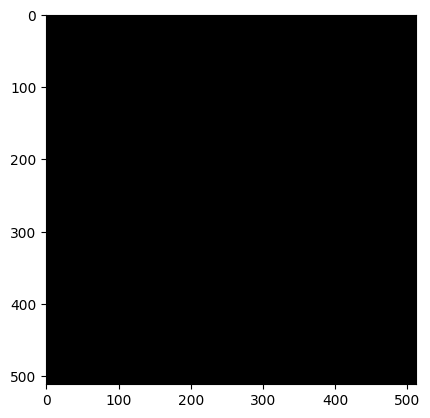

In [52]:
B = A
A[:,:,:] = 0
plt.imshow(B)
plt.show()

- Next, we can manipulate elements using indexing.
- In the following piece of code, we create a new array baboon_red and set all but the red color channels to zero.
- Therefore, when we display the image, it appears red:

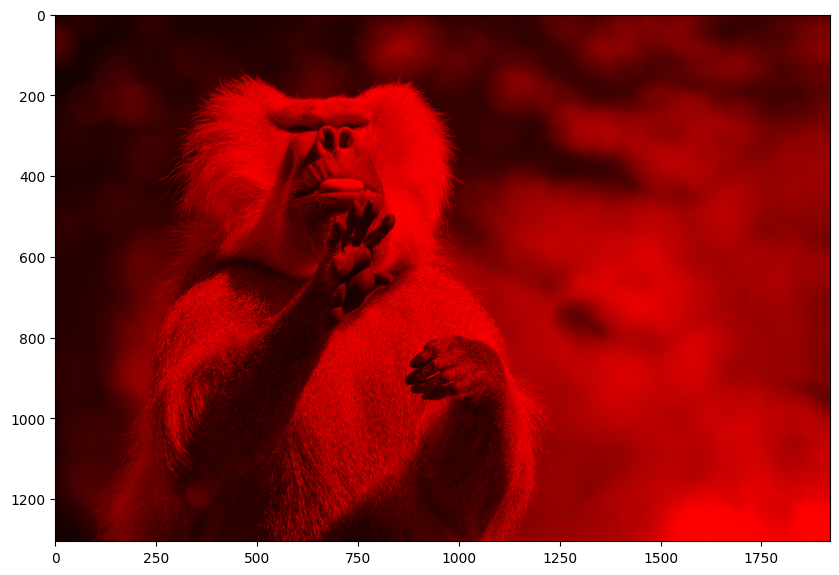

In [53]:
baboon_red = baboon.copy()
baboon_red[:, :, 0] = 0
baboon_red[:, :, 1] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(baboon_red, cv2.COLOR_BGR2RGB))
plt.show()

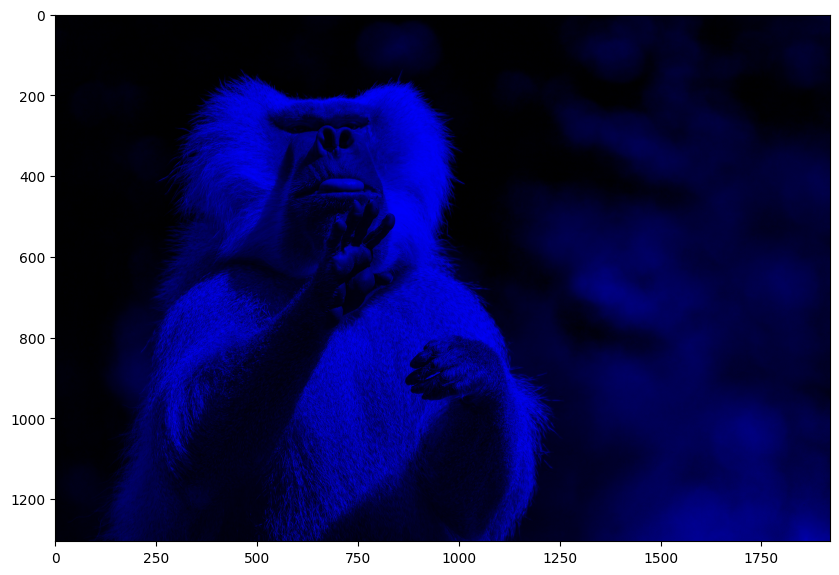

In [54]:
#for blue
baboon_blue = baboon.copy()
baboon_blue[:, :, 1] = 0
baboon_blue[:, :, 2] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))
plt.show()

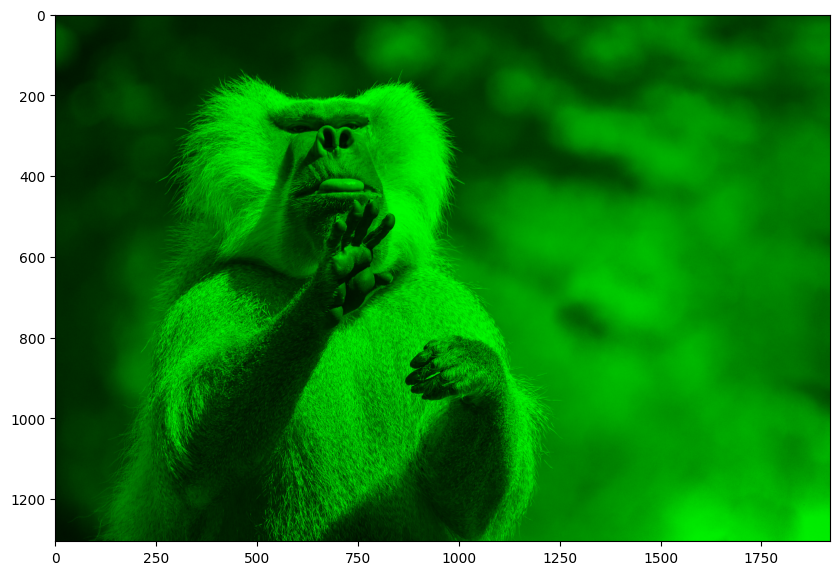

In [55]:
#for green
baboon_green = baboon.copy()
baboon_green[:, :, 0] = 0
baboon_green[:, :, 2] = 0
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon_green, cv2.COLOR_BGR2RGB))
plt.show()

In [56]:
image=cv2.imread('baboon.png')

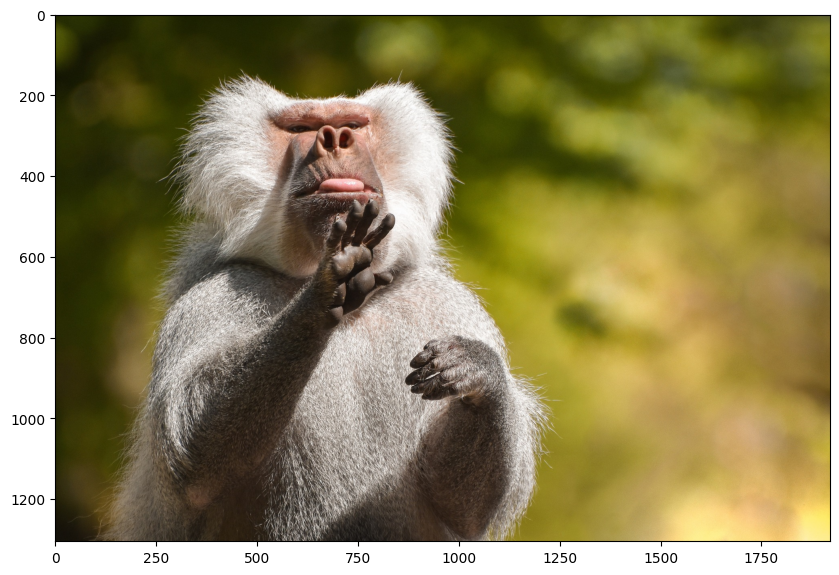

In [57]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

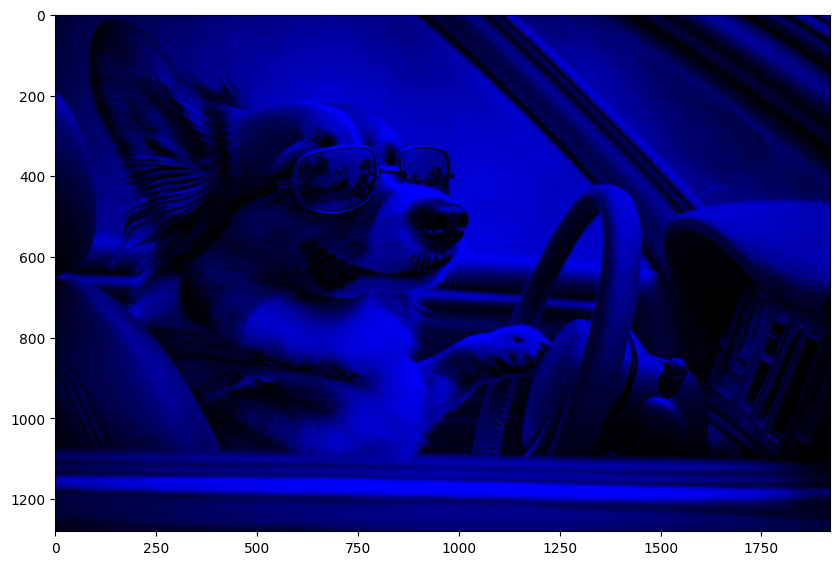

In [59]:
image=cv2.imread('driver.jpg') # replace to another image
baboon_blue=image.copy()
baboon_blue[:,:,1] = 0
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))
plt.show()

Question 1:
use any image you like.

Open the image and create a OpenCV Image object called image_blue, convert the image from BGR format to RGB format, get the blue channel out of it, and finally plot the image

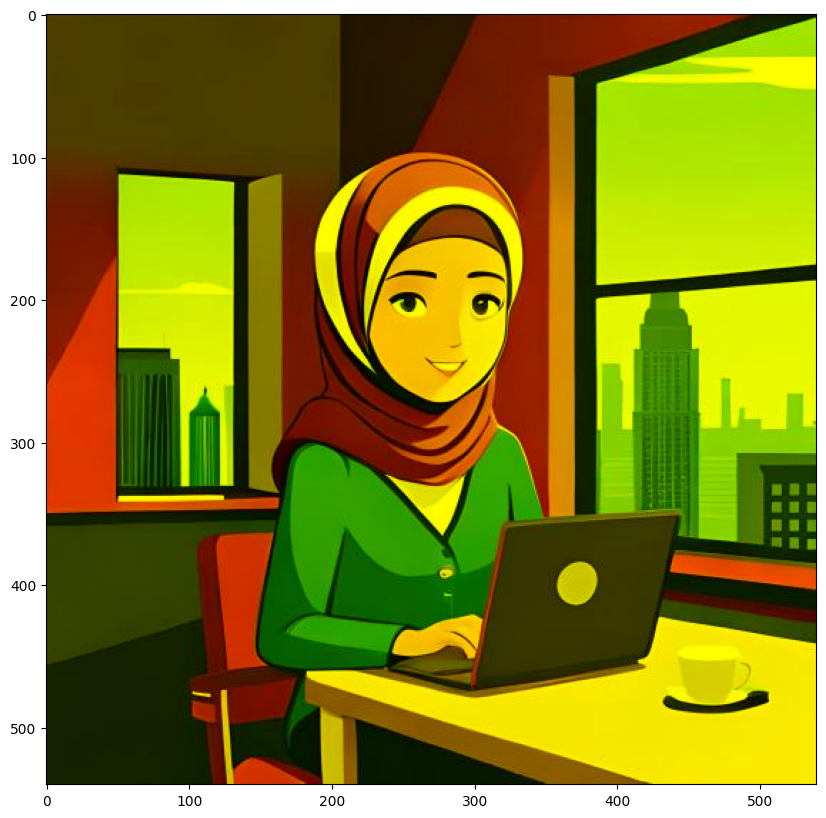

In [60]:
hijabist_blue=cv2.imread('hijabist programmer.jpg')
hijabist_blue=cv2.cvtColor(hijabist_blue, cv2.COLOR_BGR2RGB)
hijabist_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(hijabist_blue)
plt.show()


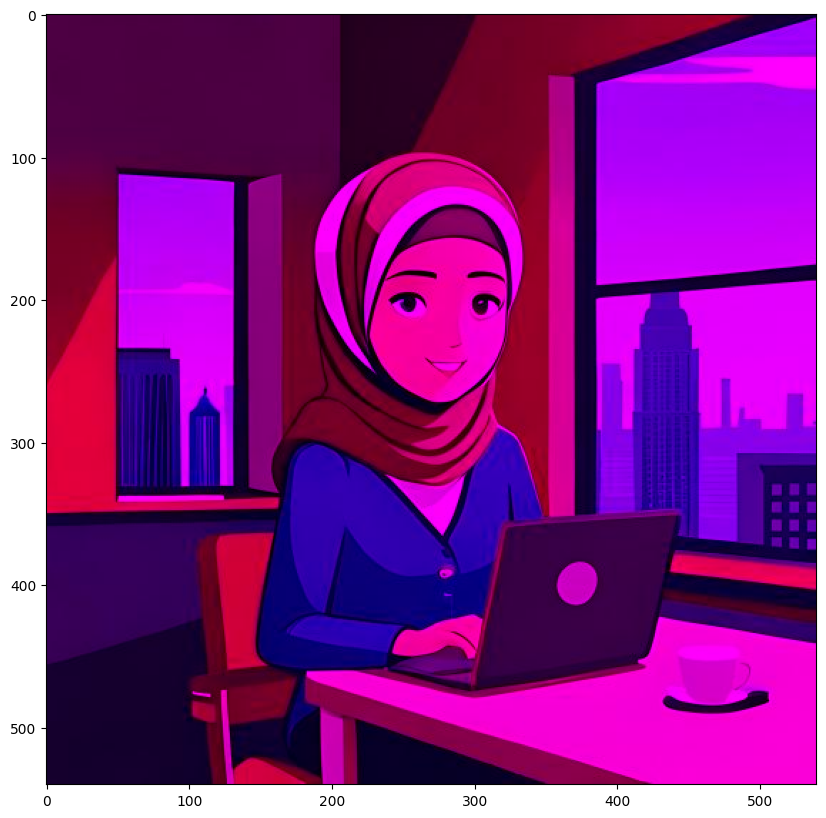

In [61]:
hijabist_blue=cv2.imread('hijabist programmer.jpg')
hijabist_blue=cv2.cvtColor(hijabist_blue, cv2.COLOR_BGR2RGB)
hijabist_blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(hijabist_blue)
plt.show()

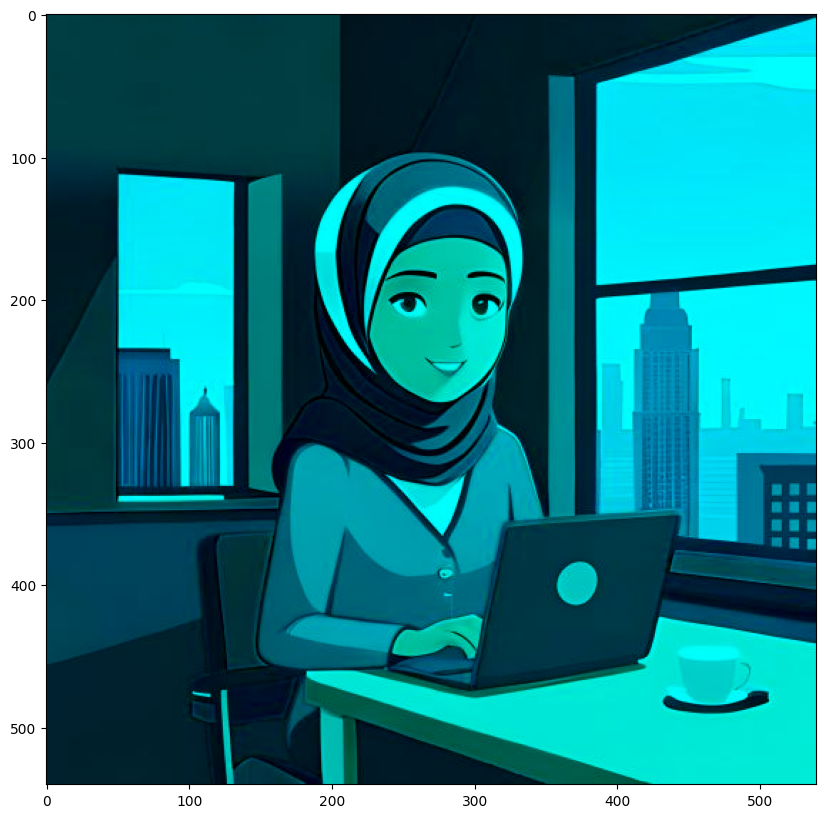

In [62]:
hijabist_blue=cv2.imread('hijabist programmer.jpg')
hijabist_blue=cv2.cvtColor(hijabist_blue, cv2.COLOR_BGR2RGB)
hijabist_blue[:,:,0] = 0
plt.figure(figsize=(10,10))
plt.imshow(hijabist_blue)
plt.show()